# **Dataset: Food Image Dataset: Food-11**


## **Visión por Computador: Automatizando la Categorización de Macronutrientes**

* Andrés Felipe Jaramillo Tamayo



Lamentablemente, la descarga del dataset no fue posible debido a la gran cantidad de imágenes presentes en el conjunto de datos, lo que generó restricciones en el proceso de descarga. Sin embargo, se proporciona el nombre del dataset para que los interesados puedan buscar y acceder a él directamente en la plataforma Kaggle. Esto permite a los usuarios interesados encontrar y descargar el dataset por sí mismos desde la fuente original, superando así las limitaciones de tamaño que se presentaron en este contexto específico.

## **Justificación**

### **¿Qué?**
Análisis de imágenes para la identificación de grupos de macronutrientes en platos de comida de una base de datos del repositorio kaggle: un enfoque de procesamiento de imágenes para la evaluación y seguimiento nutricional de personas con desordenes alimenticios.


### **¿Para qué?**
El propósito de esta iniciativa se centra en la mejora de la gestión nutricional individualizada, particularmente en el contexto de enfrentar problemas de trastornos alimenticios que pueden manifestarse desde edades tempranas. A través del análisis de imágenes de platos de comida, buscamos proporcionar herramientas y conocimientos que permitan una atención más precisa, personalizada en la planificación de la dieta y el seguimiento nutricional de las personas afectadas por estos trastornos. La idea principal es contribuir a un enfoque más efectivo y temprano en la detección y tratamiento de desórdenes alimenticios, mejorando así la calidad de vida de quienes los padecen y fomentando hábitos alimenticios saludables desde edades tempranas.

### **¿Cómo?**
A continuación, se describe la metodología general para llevar a cabo este proceso:

**Lectura de datos etiquetados:** Se inicia con la recopilación de un conjunto de datos que contenga imágenes de alimentos etiquetadas con información detallada sobre los macronutrientes presentes en cada alimento. Estos datos etiquetados servirán como el conjunto de entrenamiento y validación para nuestros modelos.

**Preprocesamiento de datos:** Antes de utilizar las imágenes, es esencial realizar un preprocesamiento de datos. Esto puede incluir la normalización de tamaños, corrección de colores y ajuste de la resolución. También se pueden eliminar datos irrelevantes o de baja calidad para mejorar la precisión.

**Segmentación de plato:** Una vez que se tiene una imagen de un plato, es necesario segmentarla en regiones individuales que representen cada alimento presente en la imagen. Técnicas de segmentación de imágenes, como la detección de contornos, pueden ser útiles para este propósito.

**Segmentación de alimentos:** Cada alimento dentro del plato debe ser segmentado en su propia región, de modo que pueda analizarse de manera individual. Esto implica un proceso de segmentación adicional para aislar los alimentos.

**Entrenamiento para reconocimiento de macronutrientes:** Para reconocer los macronutrientes en cada alimento, se entrenan modelos de aprendizaje automático utilizando el conjunto de datos etiquetados. Estos modelos deben ser capaces de identificar y clasificar los macronutrientes, como proteínas, carbohidratos y grasas, en función de las imágenes de los alimentos.

## **Librerías**

In [ ]:
# Librerías
import os
import sys
import glob
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import cv2
import PIL
import random
import seaborn as sns

# Tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import GlobalAveragePooling2D
from keras.layers import Input, Dense, Dropout, Flatten
from keras.applications import InceptionResNetV2
from keras.models import Model
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.python.client import device_lib

# Sklearn
import sklearn
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import classification_report

# Skimage
from skimage import io
import skimage.io
import skimage.color
import skimage.filters
from skimage import feature

# Warnings
import warnings

Filtro para retirar Warnings

In [ ]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
os.environ['TF_DISABLE_NUMA'] = '1'
os.environ['PYDEVD_DISABLE_FILE_VALIDATION'] = '1'
warnings.filterwarnings("ignore", category=UserWarning, module="tensorflow")
warnings.filterwarnings('ignore')
matplotlib.use('TkAgg')
%matplotlib inline

## **Descripción de datos**

### **Lectura de los datos**

In [ ]:
path = os.getcwd()
path_kaggle = os.path.join(path,'Kaggle_Dataset')
print(path_kaggle)
training_path = os.path.join(path_kaggle,'training')
classes = os.listdir(training_path)
classes

d:\UNAL\Master Analytics\2023-2S\Computer Vision\Trabajo Final\Kaggle_Dataset


['Bread',
 'Dairy product',
 'Dessert',
 'Egg',
 'Fried food',
 'Meat',
 'Noodles-Pasta',
 'Rice',
 'Seafood',
 'Soup',
 'Vegetable-Fruit']

In [ ]:
validation_path = os.path.join(path_kaggle,'validation')
training_path = os.path.join(path_kaggle, 'training')
evaluation_path = os.path.join(path_kaggle, 'evaluation')

### **Análisis de los datos**

In [ ]:
X_list = []
Y_list = []

for f in range(11):
    folder_path = os.path.join(training_path, classes[f])
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)

        # Revisar que sea una imagen jpg
        if not(file.endswith(".jpg")):
            continue

        # Leer la imagen
        prueba = file_path
        img = image.load_img(file_path)

        X_list.append(prueba)
        Y_list.append(classes[f])

In [ ]:
print("Forma de la matriz de características X")
print(np.shape(X_list))
print("\nForma de la matriz de etiquetas Y")
print(np.shape(Y_list))

class_types, counts = np.unique(Y_list, return_counts=True)

print("\nEtiquetas de las clases")
print(class_types)
print("\nConteo de las clases")
print(counts)

Forma de la matriz de características X
(9866,)

Forma de la matriz de etiquetas Y
(9866,)

Etiquetas de las clases
['Bread' 'Dairy product' 'Dessert' 'Egg' 'Fried food' 'Meat'
 'Noodles-Pasta' 'Rice' 'Seafood' 'Soup' 'Vegetable-Fruit']

Conteo de las clases
[ 994  429 1500  986  848 1325  440  280  855 1500  709]


In [ ]:
image_train_list = []
folder_train_list = os.listdir(training_path)
for folder in folder_train_list:
    filename_list = os.listdir(os.path.join(training_path, folder))
    for image_name in filename_list:
        image_train_list.append((cv2.cvtColor(cv2.imread(os.path.join(training_path,folder,image_name)), cv2.COLOR_BGR2RGB),folder))

def show_images(image_list, index):
    i=int(index.shape[0]/2)
    fig, axes = plt.subplots(nrows=i, ncols=2, figsize=(12,6*i))
    for i in range(i):
        axes[i,0].imshow(image_list[index[i*2]][0])
        axes[i,0].set_title(image_list[index[i*2]][1])
        axes[i,1].imshow(image_list[index[i*2+1]][0])
        axes[i,1].set_title(image_list[index[i*2+1]][1])


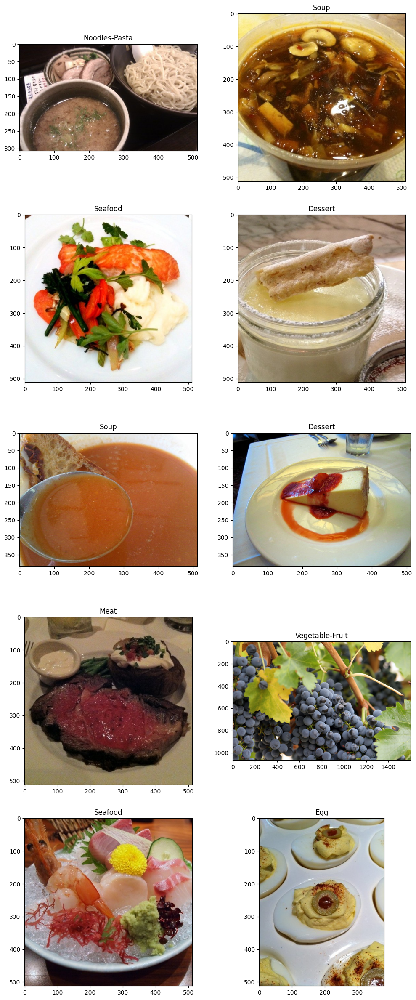

In [ ]:
index = np.random.randint(low=0, high=len(image_train_list), size=10)
show_images(image_train_list, index)

Se definen arreglos para determinar su tamaño y características.

In [ ]:
for i in index:
  Image1 = image_train_list[i]
  print(Image1[1])
  print('---------------------------')
  print('Tipo de imagen: ' , type(Image1[0]))
  print('Forma de la imagen: {}'.format(Image1[0].shape))
  print('Altura de la imagen: {}'.format(Image1[0].shape[0]))
  print('Ancho de la imagen: {}'.format(Image1[0].shape[1]))
  print('Dimensión de la imagen: {}'.format(Image1[0].ndim))
  print('---------------------------')

Noodles-Pasta
---------------------------
Tipo de imagen:  <class 'numpy.ndarray'>
Forma de la imagen: (307, 512, 3)
Altura de la imagen: 307
Ancho de la imagen: 512
Dimensión de la imagen: 3
---------------------------
Soup
---------------------------
Tipo de imagen:  <class 'numpy.ndarray'>
Forma de la imagen: (512, 512, 3)
Altura de la imagen: 512
Ancho de la imagen: 512
Dimensión de la imagen: 3
---------------------------
Seafood
---------------------------
Tipo de imagen:  <class 'numpy.ndarray'>
Forma de la imagen: (512, 511, 3)
Altura de la imagen: 512
Ancho de la imagen: 511
Dimensión de la imagen: 3
---------------------------
Dessert
---------------------------
Tipo de imagen:  <class 'numpy.ndarray'>
Forma de la imagen: (512, 512, 3)
Altura de la imagen: 512
Ancho de la imagen: 512
Dimensión de la imagen: 3
---------------------------
Soup
---------------------------
Tipo de imagen:  <class 'numpy.ndarray'>
Forma de la imagen: (384, 512, 3)
Altura de la imagen: 384
Ancho de

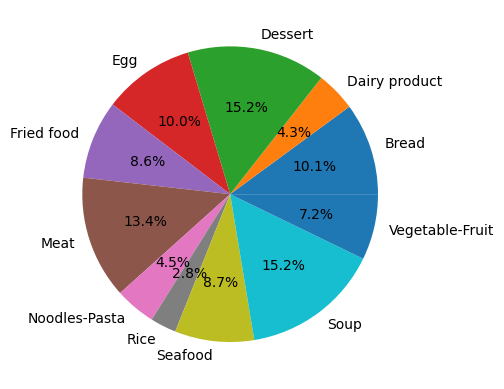

In [ ]:
train = {}
for i in os.listdir(training_path):
    train[i] = os.listdir(os.path.join(training_path, i))
fig, ax = plt.subplots()
ax.pie(
    [len(train[item]) for item in train],
    labels = train.keys(),
    autopct = "%1.1f%%"
)
fig.show()

In [ ]:
for item in train.keys():
    print(item, len(train[item]))

Bread 994
Dairy product 429
Dessert 1500
Egg 986
Fried food 848
Meat 1325
Noodles-Pasta 440
Rice 280
Seafood 855
Soup 1500
Vegetable-Fruit 709


### **Conclusiones de los datos**

Las principales limitaciones que podemos encontrar al momento de entrenar el modelo con el Dataset serían las siguientes:

* Se cuenta con muchas clases, lo que hará más complejo el entrenamiento del modelo. Es posible que el modelo se confunda entre clases que parezcan similares, por lo tanto, es necesario contar con una buena cantidad de imágenes para aumetar la generalización del mismo.

* Si bien parece que el conjunto de entrenamiento cuenta con una cantidad de imágenes promedio para cada clase, al mirar particularmente las clases de Daily product, Noodles-Pasta y Rice, estas cuentan con pocas imágenes, lo que puede generar que el modelo no tenga una alta capacidad de generalización, problemas de sobreajuste y problemas a la hora de evaluar el modelo, posiblemente en estas clases el performance no sea tan bueno.

* Tal como se mencionó anteriormente, se cuenta con imágenes de diferentes tamaños, formas y orientación. Esto puede dificultar la detección o clasificación del modelo ya que este debe ser capaz de identificar estas variaciones. Sin embargo, implementando una buena estrategia de preprocesamiento de la data se espera limitar este problema.

* Adicionalmente, se cuenta con backgrounds no estandarizados, de nuevo esto podría generar que el modelo se confunda y extraiga características de los fondos y no del plato de comida.

* Se identifico que varias imágenes cuentan con iluminación variable, esto puede afectar la apariencia de los platos de comida y a la larga confundir al modelo.

## **Machine Learning**

Inicialmente se muestra el procesamiento, y después los datos son llevados a una función de python para procesar todo el conjunto de imágenes.

El inicio del proceso implica la definición del tamaño de la imagen (dim), que debe coincidir con el tamaño elegido previamente para la red neuronal. Posteriormente, se procede a cargar la imagen y aplicar una operación de redimensionamiento para estandarizar todas las imágenes en el conjunto.

In [ ]:
# Selecciona un índice aleatorio dentro del rango de las imágenes de entrenamiento
i = np.random.randint(0, len(image_train_list))

# Define las dimensiones deseadas para la imagen resultante
dim = (256, 256)

# Carga la imagen correspondiente a la posición i en la lista de imágenes de entrenamiento
image = skimage.io.imread(X_list[i])

# Imprime la forma (dimensiones) de la imagen cargada
print(np.shape(image))

# Aplica una operación de redimensionamiento a la imagen utilizando las dimensiones definidas
# La interpolación INTER_AREA es utilizada para conservar la información de la imagen al cambiar su tamaño
resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)

(260, 348, 3)


Seleccionamos aleatoriamente una imagen de entrenamiento, la redimensionamos a un tamaño específico, mejoramos su contraste mediante la ecualización del histograma y luego mostramos la imagen original y la ecualizada.

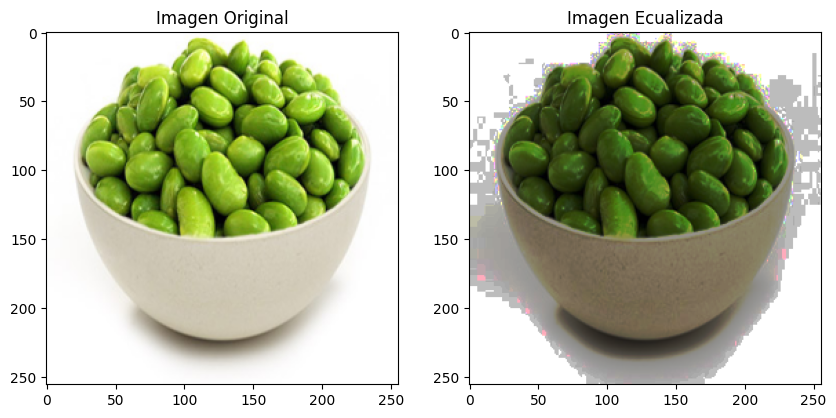

In [ ]:
# Ecualizar el histograma de la imagen
equalized_image = skimage.exposure.equalize_hist(resized)

# Crear una figura para mostrar la imagen original y la imagen ecualizada
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(resized, cmap="gray")
axes[0].set_title("Imagen Original")
axes[1].imshow(equalized_image, cmap="gray")
axes[1].set_title("Imagen Ecualizada")

# Mostrar las imágenes
plt.show()

A continuación, se transforma una imagen previamente ecualizada a escala de grises y se le aplica una corrección gamma para afinar su brillo y contraste. Luego, ambas versiones, la imagen original en escala de grises y la imagen modificada con corrección gamma, son mostradas en una figura compuesta por dos subtramas para su visualización comparativa.

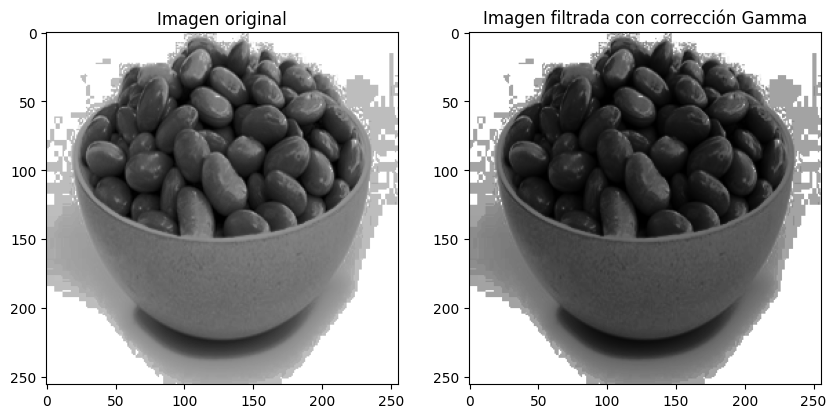

In [ ]:
from skimage import exposure

# Se convierte la imagen previamente ecualizada a escala de grises
gray = skimage.color.rgb2gray(equalized_image)

# Se ajusta el valor de gamma según sea necesario (1.0 es sin corrección)
gamma = 1.5  # Ajusta el valor de gamma según tus necesidades, mayor que 1 aumenta el contraste, menor que 1 lo disminuye
gamma_corrected_image = exposure.adjust_gamma(gray, gamma)

# Se crea una figura para mostrar la imagen original y la imagen filtrada con corrección gamma
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Se muestra la imagen original en escala de grises en la primera subtrama
axes[0].imshow(gray, cmap="gray")
axes[0].set_title("Imagen original")

# Se muestra la imagen filtrada con corrección gamma en la segunda subtrama
axes[1].imshow(gamma_corrected_image, cmap="gray")
axes[1].set_title("Imagen filtrada con corrección Gamma")

# Muestra la figura con las dos imágenes
plt.show()

Acá observamos el histograma resultante:

(0.0, 1.0)

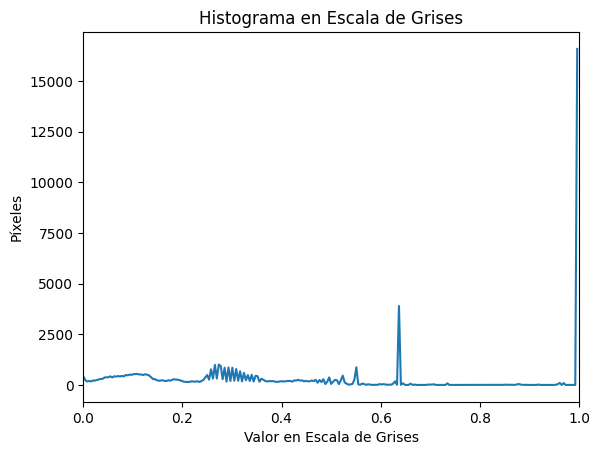

In [ ]:
# Se crea un histograma de la imagen filtrada con corrección gamma
histogram, bin_edges = np.histogram(gamma_corrected_image, bins=256, range=(0.0, 1.0))

fig, ax = plt.subplots()
plt.plot(bin_edges[0:-1], histogram)
plt.title("Histograma en Escala de Grises")
plt.xlabel("Valor en Escala de Grises")
plt.ylabel("Píxeles")
plt.xlim(0, 1.0)

#### **Extracción de características**

Por último creamos una máscara, usando la técnica de umbralización Otsu.

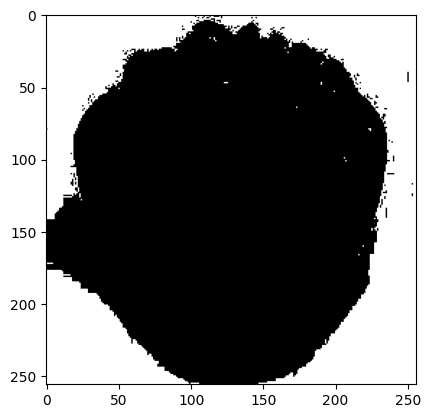

In [ ]:
# Se crea la máscara binaria
t = skimage.filters.threshold_otsu(gamma_corrected_image)
binary_mask = gamma_corrected_image > t

fig, ax = plt.subplots()
plt.imshow(binary_mask, cmap="gray")

La imagen resultante sería esta, lo que permite concluir que los pasos aplicados son ideales para la segmentación de la imagen.

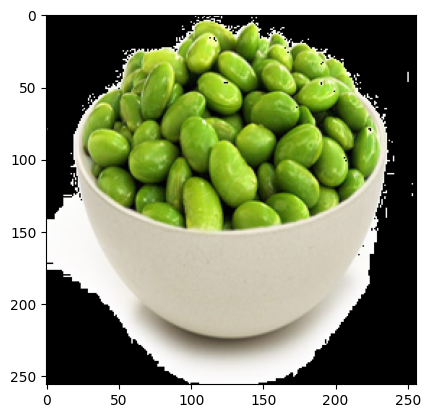

In [ ]:
# Se aplica la máscara a la imagen original
selection = resized.copy()
selection[binary_mask] = 0

fig, ax = plt.subplots()
plt.imshow(selection)

#### **Preprocesamiento general**

Aplicando los pasos anteriores en una función, obtenemos a ```preprocessing```, el cual nos entrega un array con todo el preprocesamiento.

In [ ]:
def preproccesing(filename):

    # Se carga la imagen
    image = skimage.io.imread(fname=filename)

    # Se redimensiona la imagen
    dim = (256, 256)
    resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)

    # Se ecualiza el histograma de la imagen
    equalized_image = skimage.exposure.equalize_hist(resized)

    # Se convierte la imagen a escala de grises
    gray = skimage.color.rgb2gray(equalized_image)

    # Se aplica un corrector gamma a la imagen filtrada
    gamma = 1.5  # Se ajusta el valor de gamma
    gamma_corrected_image = exposure.adjust_gamma(gray, gamma)

    t = skimage.filters.threshold_otsu(gamma_corrected_image)
    binary_mask = gamma_corrected_image > t

    selection = resized.copy()
    selection[binary_mask] = 0

    return selection

Definimos la función y la aplicamos a todas las imagenes de entrenamiento.

In [ ]:
X_list = []
Y_list = []

for f in range(11):
    folder_path = os.path.join(training_path, classes[f])
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)

        # Se revisa la extensión del archivo
        if not(file.endswith(".jpg")):
            continue

        # Se carga la imagen
        img = preproccesing(file_path)

        X_list.append(img.ravel())
        Y_list.append(f)

Volvemos a todas las imagenes en arrays, e imprimos su tamaño. Es 196608 debido a que eran imagenes de 256x256x3, con un total de 9866 imagenes.

In [ ]:
X = np.asarray(X_list, dtype=np.float32)
Y = np.asarray(Y_list, dtype=np.float32)

X, Y = shuffle(X, Y)

print("Forma de la matriz de características X")
print(X.shape)
print("\nForma de la matriz de etiquetas Y")
print(Y.shape)

class_types, counts = np.unique(Y, return_counts=True)

print("\nEtiquetas de las clases")
print(class_types)
print("\nConteo de las clases")
print(counts)

Forma de la matriz de características X
(9866, 196608)

Forma de la matriz de etiquetas Y
(9866,)

Etiquetas de las clases
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]

Conteo de las clases
[ 994  429 1500  986  848 1325  440  280  855 1500  709]


Realizamos la partición de los datos, teniendo como parametro a stratify, con el fin que todas las clases tengan una participación similar y no hallan desbalanceos.

#### **Partición de los datos**

In [ ]:
train_X, test_X, train_Y, test_Y = train_test_split(X, Y, stratify=Y,
                                                    test_size=0.2,
                                                    random_state=42)
print("Forma de train_X")
print(train_X.shape)
print("\nForma de test_X")
print(test_X.shape)

Forma de train_X
(7892, 196608)

Forma de test_X
(1974, 196608)


La distribución la podemos ver en el siguiente gráfico:

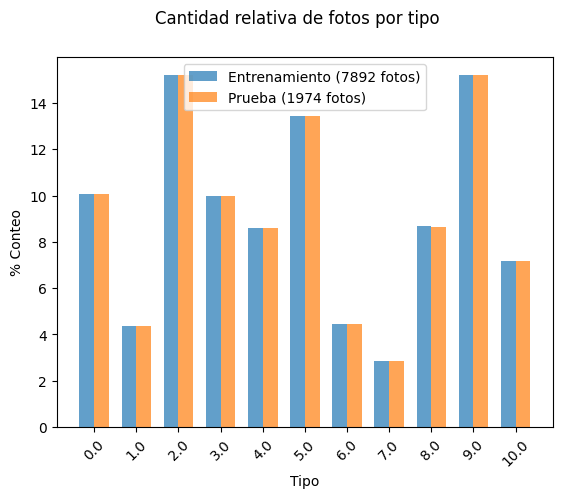

In [ ]:
def plot_bar(y, loc='left', relative=True):
    width = 0.35
    if loc == 'left':
        n = -0.5
    elif loc == 'right':
        n = 0.5

    unique, counts = np.unique(y, return_counts=True)
    sorted_index = np.argsort(unique)
    unique = unique[sorted_index]

    if relative:
        counts = 100*counts[sorted_index]/len(y)
        ylabel_text = '% Conteo'
    else:
        counts = counts[sorted_index]
        ylabel_text = 'Conteo'

    xtemp = np.arange(len(unique))

    plt.bar(xtemp + n*width, counts, align='center', alpha=.7, width=width)
    plt.xticks(xtemp, unique, rotation=45)
    plt.xlabel('Tipo')
    plt.ylabel(ylabel_text)

plt.suptitle('Cantidad relativa de fotos por tipo')
plot_bar(train_Y, loc='left')
plot_bar(test_Y, loc='right')
plt.legend([
    'Entrenamiento ({0} fotos)'.format(len(train_Y)),
    'Prueba ({0} fotos)'.format(len(test_Y))
])

### **Primer método de ML: Support Vector Machine**

El SVM es un algoritmo ampliamente utilizado para tareas de clasificación. Se destaca por su eficacia en la separación de datos en diferentes categorías o clases, lo que lo hace valioso en la toma de decisiones basadas en patrones y en la resolución de problemas de clasificación en diversos dominios, como el procesamiento de imágenes, el análisis de texto y la detección de fraudes, entre otros. Así, obtenemos los siguientes parámetros de precisión, recall y f1-score:

In [ ]:
from sklearn import svm
from sklearn.metrics import classification_report

# Hiperparámetros del modelo SVM lineal
kernel = 'linear'
C = 1
batch_size = 100  # Tamaño del lote

# Se crea un clasificador SVM lineal
svm_lin = svm.SVC(kernel=kernel, C=C)

# Se dividen los datos de entrenamiento en lotes
num_samples = len(train_X)
for i in range(0, num_samples, batch_size):
    start = i
    end = min(i + batch_size, num_samples)

    # Se obtiene el lote actual
    batch_X = train_X[start:end]
    batch_Y = train_Y[start:end]

    # Se entrena el modelo SVM con el lote actual
    svm_lin.fit(batch_X, batch_Y)

# Se realizan predicciones en los datos de prueba
y_pred = []
for i in range(0, len(test_X), batch_size):
    batch_X_test = test_X[i:i+batch_size]
    batch_Y_pred = svm_lin.predict(batch_X_test)
    y_pred.extend(batch_Y_pred)


#### **Reporte de Métricas de Evaluación**
Se presentan las métricas de evaluación para cada clase.

In [ ]:
# Se muestra el reporte de clasificación
print(classification_report(test_Y, y_pred, target_names=classes))

                 precision    recall  f1-score   support

          Bread       0.11      0.07      0.08       199
  Dairy product       0.00      0.00      0.00        86
        Dessert       0.16      0.22      0.18       300
            Egg       0.10      0.03      0.05       197
     Fried food       0.07      0.01      0.02       170
           Meat       0.18      0.31      0.23       265
  Noodles-Pasta       0.02      0.01      0.01        88
           Rice       0.16      0.05      0.08        56
        Seafood       0.09      0.01      0.02       171
           Soup       0.16      0.29      0.21       300
Vegetable-Fruit       0.07      0.13      0.09       142

       accuracy                           0.14      1974
      macro avg       0.10      0.10      0.09      1974
   weighted avg       0.12      0.14      0.12      1974



Para tener una metrica que pueda comparar este metodo de ML con el de Deep Learning empleamos la precisión:

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(test_Y, y_pred)
print("Precisión: %.2f%%" % (accuracy * 100.0))

Precisión: 14.18%


#### **Matriz de confusión**
Se grafica la matriz de confusión para observar el comportamiento del clasificador.

In [ ]:
from sklearn.metrics import confusion_matrix

cmx = confusion_matrix(test_Y, y_pred)
cmx

array([[13,  0, 55,  7,  6, 44,  1,  2,  2, 44, 25],
       [ 8,  0,  8,  2,  3, 10,  3,  4,  5, 23, 20],
       [16,  0, 65,  8,  4, 70, 10,  0,  5, 90, 32],
       [17,  0, 33,  6,  2, 35,  9,  0,  1, 69, 25],
       [ 6,  0, 33,  4,  2, 54,  5,  2,  0, 33, 31],
       [14,  0, 75,  8,  3, 82,  3,  2,  1, 55, 22],
       [ 3,  0, 14,  8,  1, 24,  1,  1,  0, 12, 24],
       [ 3,  0,  7,  3,  0, 10,  2,  3,  2, 16, 10],
       [ 5,  0, 33,  2,  1, 38,  7,  1,  2, 67, 15],
       [26,  0, 56,  6,  6, 56, 16,  4,  3, 87, 40],
       [ 5,  0, 36,  4,  1, 25,  4,  0,  1, 47, 19]], dtype=int64)

Se asignan los nombres de etiquetas a los índices correspondientes para mayor facilidad de lectura.

In [ ]:
# Lista de etiquetas legible
labels = {
    0: 'Bread',
    1: 'Dairy product',
    2: 'Dessert',
    3: 'Egg',
    4: 'Fried food',
    5: 'Meat',
    6: 'Noodles-Pasta',
    7: 'Rice',
    8: 'Seafood',
    9: 'Soup',
    10: 'Vegetable-Fruit'
}

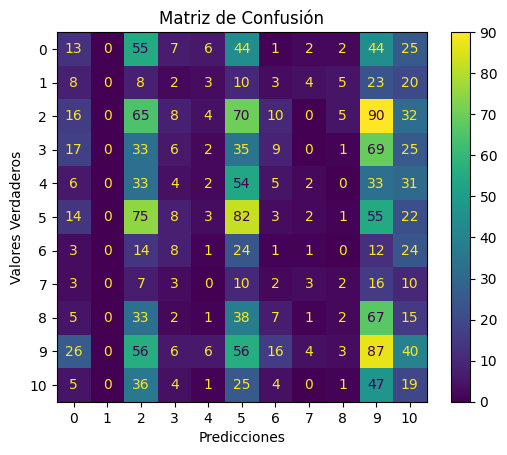

In [ ]:
# Matriz de confusión con etiquetas legibles
disp = ConfusionMatrixDisplay(confusion_matrix=cmx, display_labels=labels)
disp.plot(cmap='viridis')

# Se agregan títulos y etiquetas
plt.title('Matriz de Confusión')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')

plt.show()

### **Segundo método de ML: Clasificador Multinomial Naive Bayes**

El MultinomialNB es un algoritmo ampliamente utilizado para tareas de clasificación. Entrenar y evaluar un modelo Multinomial Naive Bayes en lotes significa dividir los datos de entrenamiento en pequeños grupos, ajustar el modelo a cada grupo por separado y luego combinar las predicciones para evaluar su rendimiento. Esto ayuda a manejar grandes conjuntos de datos cuando no es posible entrenar en una sola pasada debido a limitaciones de recursos. Así, con este logramos la siguiente precision, recall y f1-score:

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report

# Hiperparámetros del modelo Naive Bayes
params = {
    'alpha': 1.0,          # Parámetro de suavizado Laplaciano
    'fit_prior': True,     # Estimar las probabilidades previas de clase
    'class_prior': None    # Probabilidades previas de clase
}

# Número de lotes y tamaño del lote
batch_size = 100
num_batches = len(train_X) // batch_size
print("Número de lotes:", num_batches)

# Lista para almacenar los modelos entrenados
batch_models = []

# Se crea el modelo Naive Bayes una vez
naive_bayes = MultinomialNB(**params)

# Se entrena el modelo Naive Bayes en lotes
for i in range(num_batches):
    start = i * batch_size
    end = min(len(train_X), (i + 1) * batch_size)

    # Se obtiene el lote actual
    batch_X = train_X[start:end]
    batch_Y = train_Y[start:end]

    # Se entrena el modelo Naive Bayes con el lote actual
    naive_bayes.partial_fit(batch_X, batch_Y, classes=np.unique(train_Y))

    # Se agrega el modelo entrenado a la lista
    batch_models.append(naive_bayes)

# Se realizan predicciones en los datos de prueba
y_pred = []

for i in range(0, len(test_X), batch_size):
    batch_X_test = test_X[i:i+batch_size]

    # Se obtiene el modelo entrenado correspondiente al lote actual
    batch_naive_bayes = batch_models[i // batch_size]

    # Se realizan predicciones en el lote actual
    batch_Y_pred = batch_naive_bayes.predict(batch_X_test)

    # Se agregan las predicciones del lote actual a y_pred
    y_pred.extend(batch_Y_pred)

Número de lotes: 78


#### **Reporte de Métricas de Evaluación**
Se presentan las métricas de evaluación para cada clase.

In [ ]:
# Se muestra el reporte de clasificación
print(classification_report(test_Y, y_pred, target_names=classes))

                 precision    recall  f1-score   support

          Bread       0.10      0.05      0.06       199
  Dairy product       0.08      0.27      0.12        86
        Dessert       0.21      0.08      0.12       300
            Egg       0.16      0.31      0.22       197
     Fried food       0.20      0.33      0.25       170
           Meat       0.29      0.33      0.31       265
  Noodles-Pasta       0.12      0.34      0.17        88
           Rice       0.06      0.07      0.06        56
        Seafood       0.15      0.05      0.08       171
           Soup       0.11      0.02      0.03       300
Vegetable-Fruit       0.19      0.11      0.14       142

       accuracy                           0.16      1974
      macro avg       0.15      0.18      0.14      1974
   weighted avg       0.17      0.16      0.14      1974



Para tener una metrica que pueda comparar este metodo de ML con el de Deep Learning empleamos la precisión:

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(test_Y, y_pred)
print("Precisión: %.2f%%" % (accuracy * 100.0))

Precisión: 16.46%


#### **Matriz de confusión**
Se grafica la matriz de confusión para observar el comportamiento del clasificador.

In [ ]:
from sklearn.metrics import confusion_matrix

cmx = confusion_matrix(test_Y, y_pred)
cmx

array([[ 9, 17, 17, 39, 29, 31, 20,  9,  8,  9, 11],
       [ 6, 23,  7, 28,  4,  4,  6,  2,  0,  5,  1],
       [12, 68, 24, 54, 19, 56, 27, 11, 15,  7,  7],
       [ 3, 31, 10, 61, 21, 17, 22, 14,  2,  9,  7],
       [17,  5,  6, 16, 56, 24, 25,  5,  2,  5,  9],
       [11, 15, 21, 24, 50, 88, 31,  8, 11,  0,  6],
       [ 4,  7,  3,  6, 15, 14, 30,  1,  1,  2,  5],
       [ 1, 11,  0, 21,  4,  3,  8,  4,  1,  2,  1],
       [ 3, 45, 10, 28, 20, 26, 13,  7,  9,  3,  7],
       [24, 48,  8, 67, 37, 32, 55,  5,  8,  6, 10],
       [ 4, 20,  6, 26, 22, 12, 23,  4,  5,  5, 15]], dtype=int64)

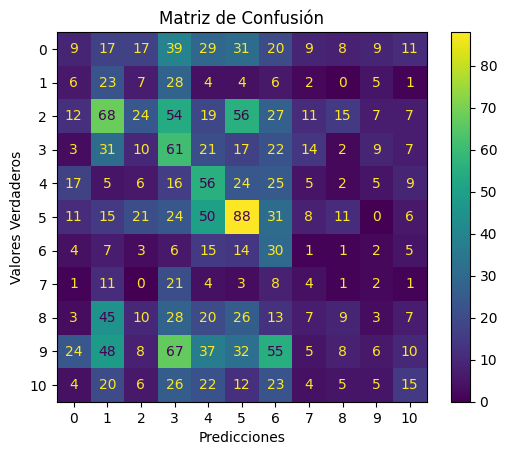

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cmx, display_labels=labels)
disp.plot(cmap='viridis')

# Se agregan títulos y etiquetas
plt.title('Matriz de Confusión')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')

plt.show()

### **Conclusiones | Machine Learning**
*   El modelo de clasificación actual presenta un rendimiento insatisfactorio en la mayoría de las clases, con bajas precisiones, recalls y F1-scores. Esto sugiere que el modelo tiene dificultades para identificar y clasificar correctamente las categorías de alimentos.

* La distribución desigual de ejemplos entre las clases, evidenciada por el soporte variable para cada clase, puede estar contribuyendo a las deficiencias del modelo. Clases con un soporte menor pueden recibir menos atención durante el entrenamiento y, por lo tanto, tener un rendimiento deficiente.

* La baja exactitud global del modelo, que es solo del 16%, indica que el modelo está lejos de ser adecuado para su uso en aplicaciones prácticas de clasificación de alimentos.

* El promedio ponderado y el promedio macro de las métricas también son bajos, lo que refuerza la idea de que el modelo necesita mejoras sustanciales en su capacidad de clasificación en todas las clases.

* Para mejorar el rendimiento del modelo, podrían ser necesarios ajustes en la arquitectura del modelo, la recopilación de datos adicionales, la estrategia de entrenamiento o la consideración de técnicas de equilibrio de clases para abordar el desequilibrio observado entre las categorías de alimentos.

* Dificultades en la Clasificación: La matriz de confusión refleja claramente las dificultades del modelo para clasificar con precisión las diferentes categorías de alimentos. La presencia de valores fuera de la diagonal principal indica que el modelo comete errores de clasificación en múltiples clases, lo que sugiere una necesidad significativa de mejora en la capacidad de clasificación.

* Desbalance de Clases Impactante: La matriz también resalta el impacto del desbalance de clases en el rendimiento del modelo. Las clases con menos ejemplos tienden a tener un rendimiento deficiente, lo que destaca la importancia de abordar el desbalance de datos durante el proceso de entrenamiento y evaluación del modelo para mejorar su capacidad de clasificación en todas las categorías de alimentos.



## **Deep Learning**

### **Hardware para ejecutar la red neuronal**

In [ ]:
warnings.filterwarnings('ignore')
print(device_lib.list_local_devices())
tf.config.list_physical_devices('GPU')
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    print(e)

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12014570776510230351
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 13988003840
locality {
  bus_id: 1
  links {
  }
}
incarnation: 16186033837717995213
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 4080, pci bus id: 0000:2d:00.0, compute capability: 8.9"
xla_global_id: 416903419
]
1 Physical GPUs, 1 Logical GPUs


2023-09-27 00:30:09.998650: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:2d:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-27 00:30:10.165158: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:2d:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-27 00:30:10.165388: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:2d:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-27 00:30:11.084549: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:2d:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-09-27 00:30:11.085054: I tensorflow/compile

In [ ]:
!nvidia-smi

/bin/bash: /root/miniconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
Wed Sep 27 00:30:15 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.112                Driver Version: 537.42       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4080        On  | 00000000:2D:00.0  On |                  N/A |
|  0%   42C    P2              60W / 320W |   2018MiB / 16376MiB |      0%      Default |
|                                         |           

Se usa PyTorch para verificar la disponibilidad y la información sobre la GPU.

In [ ]:
import torch
print(f'\nAvailable cuda = {torch.cuda.is_available()}')
print(f'\nGPUs availables = {torch.cuda.device_count()}')
print(f'\nCurrent device = {torch.cuda.current_device()}')
print(f'\nCurrent Device location = {torch.cuda.device(0)}')
print(f'\nName of the device = {torch.cuda.get_device_name(0)}')


Available cuda = True

GPUs availables = 1

Current device = 0

Current Device location = <torch.cuda.device object at 0x7f60f3ef3e90>

Name of the device = NVIDIA GeForce RTX 4080


### **Red Neuronal**

Se emplea la técnica de **Transfer Learning**, la cual aprovecha un modelo preentrenado en una tarea amplia y compleja, como la clasificación de imágenes en el conjunto de datos ImageNet.
El modelo base seleccionado es InceptionResNetV2, una arquitectura de red neuronal convolucional, esta se carga con los pesos preentrenados en ImageNet y al excluir su capa de clasificación original, se crea una base sólida y rica en características que puede utilizarse como punto de partida para abordar una tarea de clasificación de imágenes más específica. Este enfoque permite beneficiarse de la capacidad del modelo base para extraer características relevantes de las imágenes, acelerando así el proceso de entrenamiento y mejorando el rendimiento en la tarea de interés.

Inicialmente se usa **ImageDataGenerator** para realizar el preprocesamiento de las imágenes para la red neuronal CNN.

In [ ]:
train_datagen = ImageDataGenerator(
    zoom_range=0.2, # Aplica un zoom aleatorio a las imágenes. Estas se pueden agrandar o reducir en un 20%
    horizontal_flip=True, # Voltear horizontalmente aleatoriamente las imágenes
    vertical_flip=True, # Voltear verticalmente aleatoriamente las imágenes
    rotation_range=30,  # Rotaciones aleatorias a las imágenes de hasta 30 grados
    brightness_range=[0.7, 1.3],  # Ajusta aleatoriamente el brillo de las imágenes, multiplicando sus valores de píxeles por un factor aleatorio entre 0.7 y 1.3
    shear_range=0.2,  # Aplicar deformaciones de cizallamiento aleatorias a las imágenes
    width_shift_range=0.1,  # Realiza desplazamientos aleatorios en la anchura de las imágenes
    height_shift_range=0.1,  # Realiza desplazamientos aleatorios en la altura de las imágenes
    rescale=1./255, # Reescala los valores de píxeles de las imágenes dividiéndolos por 255, normalizando los valores a un rango entre 0 y 1
)
# Se aplica un reescalado a las imágenes de test
test_datagen = ImageDataGenerator(rescale=1./255)

Se generan los lotes o baches de los datos de entrenamiento y prueba. Se carga el preprocesamiento del paso anterior.
Cada uno de los parámetros se explica a continuación:
* **target_size:** Redimenciona las imágenes a un tamaño de 256x256 píxeles.
* **batch_size:** Se utiliza un tamaño de lote de 32, lo que significa que se cargarán y preprocesarán 32 imágenes a la vez durante cada iteración de entrenamiento.
* **class_mode:** Indica el modo de etiquetado de las clases. En este caso, se establece en 'categorical', lo que significa que se espera que las etiquetas de clase sean codificadas en formato one-hot encoding.

In [ ]:
# Generador de imágenes de entrenamiento
train_generator = train_datagen.flow_from_directory(
    training_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

# Generador de imágenes de test
test_generator = test_datagen.flow_from_directory(
    validation_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.


Carga del modelo base **InceptionResNetV2**, es una arquitectura de red neuronal convolucional (CNN) previamente entrenada en el conjunto de datos "ImageNet", que contiene millones de imágenes de diferentes clases. Como resultado, InceptionResNetV2 ha aprendido una gran cantidad de características útiles de imágenes.

In [ ]:
basemodel = InceptionResNetV2(
    weights = "imagenet", # Se usan los pesos preentrenados con ImageNet
    include_top = False, # Se excluye la capa de clasificación final del modelo InceptionResNetV2
    input_tensor = Input((256, 256, 3)) # Tensor de entrada, las imágenes deben tener una resolución de 256x256 píxeles y 3 canales de color (RGB)
)

In [ ]:
# Resumen del modelo base
basemodel.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 127, 127, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 127, 127, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 127, 127, 32)         0         ['batch_norm

Los pesos preentrenados de **InceptionResNetV2** no se actualizarán ni ajustarán durante el entrenamiento del modelo en esta etapa.
Los pesos del modelo base se congelan debido a que se desea aprovechar las características aprendidas previamente en tareas generales (como la clasificación de objetos en ImageNet) y evitar que se modifiquen demasiado durante el entrenamiento de mi modelo. Esto ayuda a prevenir el sobreajuste y permite que el modelo base actúe como un extractor de características confiable.

In [ ]:
basemodel.trainable = False

#### **Classification head personalizada**

Se agrega una "Classification head" personalziada al modelo base InceptionResNetV2. El headmodel, es la arquitectura personalizada.
**Model**, corresponde entonces al modelo global que combina el modelo base (InceptionResNetV2) con la cabeza de clasificación personalizada. El tensor de entrada del modelo es el mismo que el del modelo base, y la salida es el resultado de la cabeza de clasificación. En resumen, este es el modelo completo que se entrenará para la tarea de clasificación.


In [ ]:
headmodel = basemodel.output
headmodel = GlobalAveragePooling2D(name = "Global_Average_Pool")(headmodel)
headmodel = Flatten(name = "flatten")(headmodel)
headmodel = Dense(256, activation = "relu", name = "dense_1")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(128, activation = "relu", name = "dense_2")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(11, activation = "softmax", name = "output")(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

#### **Compilación del modelo**
Se define la establecen sus configuraciones de entrenamiento, como la función de pérdida, el optimizador y las métricas de evaluación.

In [ ]:
model.compile(
    loss = "categorical_crossentropy", # Función de pérdida, categorical_crossentropy se usa generalmente en la clasificación multiclase
    optimizer = SGD(learning_rate = 0.001, momentum = 0.99) # Optimizador que se utilizará para ajustar los pesos del modelo durante el entrenamiento
    , metrics = ["accuracy"])

Se aplica las técnicas de **Early Stopping** y **Model Checkpoint** para controlar y mejorar el proceso de entrenamiento del modelo.
"Early Stopping" ayuda a evitar el sobreajuste y a detener el entrenamiento cuando el modelo deja de mejorar, mientras que "Model Checkpoint" guarda el mejor modelo obtenido durante el entrenamiento para su uso posterior en la evaluación y predicción.

In [ ]:
# Se monitorea la pérdida durante el entrenamiento, el entrenamiento se detendrá si la pérdida de entrenamiento no mejora (disminuye) durante 20 épocas consecutivas
earlystopping = EarlyStopping(
    monitor = 'loss',
    verbose = 1,
    patience = 20
)

# Se guarda el modelo en un archivo cuando se obtiene el mejor valor de pérdida en validación
checkpointer = ModelCheckpoint(
    filepath = "weights.hdf5",
    verbose = 1,
    save_best_only = True
)

#### **Entrenamiento del modelo**

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch = train_generator.n // 32,
    epochs = 1,
    callbacks = [checkpointer, earlystopping]
)

2023-09-27 00:31:03.897442: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-09-27 00:31:10.951785: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-09-27 00:31:12.004310: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x2737baae0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-09-27 00:31:12.004352: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2023-09-27 00:31:12.435822: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


308/308 [==============================] - 186s 531ms/step - loss: 1.3456 - accuracy: 0.5575


Los pesos del modelo base ya se desbloquean, es decir, los pesos del modelo base se volverán a entrenar junto con las capas personalizadas que se agregaron posteriormente en la "Classification head".
El motivo de desbloquear los pesos del modelo base en esta etapa permite que el modelo se ajuste de manera más específica a los datos de entrenamiento de la tarea actual.

In [ ]:
basemodel.trainable = True

Se aplica de nuevo las técnicas de **Early Stopping** y **Model Checkpoint**,  pero se aplican durante el proceso de "fine-tuning" donde los pesos del modelo base están desbloqueados y se ajustan junto con las capas personalizadas.

In [ ]:
earlystopping = EarlyStopping(
    monitor = 'loss',
    verbose = 1,
    patience = 20
)

checkpointer = ModelCheckpoint(
    filepath = "weights_fine.hdf5",
    verbose = 1,
    save_best_only = True
)

Se inicia el proceso de "fine-tuning" del modelo durante 10 épocas con una tasa de aprendizaje muy baja, monitoreando la pérdida de entrenamiento y deteniendo el entrenamiento si es necesario según las condiciones establecidas.
La idea es afinar las características aprendidas previamente en el modelo base para que sean más específicas.

In [ ]:
# Se optimiza el modelo con una tasa de aprendizaje muy baja
history = model.fit(
    train_generator,
    steps_per_epoch = train_generator.n // 32,
    epochs = 10,
    callbacks = [checkpointer, earlystopping]
)

Epoch 1/10
308/308 [==============================] - 138s 446ms/step - loss: 0.9265 - accuracy: 0.6988
Epoch 2/10
308/308 [==============================] - 119s 384ms/step - loss: 0.8534 - accuracy: 0.7249
Epoch 3/10
308/308 [==============================] - 121s 392ms/step - loss: 0.7824 - accuracy: 0.7479
Epoch 4/10
308/308 [==============================] - 119s 387ms/step - loss: 0.7688 - accuracy: 0.7550
Epoch 5/10
308/308 [==============================] - 119s 386ms/step - loss: 0.7731 - accuracy: 0.7527
Epoch 6/10
308/308 [==============================] - 117s 381ms/step - loss: 0.7504 - accuracy: 0.7587
Epoch 7/10
308/308 [==============================] - 118s 381ms/step - loss: 0.7168 - accuracy: 0.7669
Epoch 8/10
308/308 [==============================] - 120s 390ms/step - loss: 0.6885 - accuracy: 0.7753
Epoch 9/10
308/308 [==============================] - 120s 391ms/step - loss: 0.6819 - accuracy: 0.7815
Epoch 10/10
308/308 [==============================] - 120s 391m

#### **Evaluación del modelo**

In [ ]:
evaluate = model.evaluate(
    test_generator,
    steps = test_generator.n // 32,
    verbose = 1
)

print('Prueba de precisión: {}'.format(evaluate[1]))

107/107 [==============================] - 46s 403ms/step - loss: 0.5112 - accuracy: 0.8353
Accuracy Test : 0.8352803587913513


Se asignan los nombres de etiquetas a los índices correspondientes para mayor facilidad de lectura.

In [ ]:
labels = {
    0: 'Bread',
    1: 'Dairy product',
    2: 'Dessert',
    3: 'Egg',
    4: 'Fried food',
    5: 'Meat',
    6: 'Noodles-Pasta',
    7: 'Rice',
    8: 'Seafood',
    9: 'Soup',
    10: 'Vegetable-Fruit'
}

#### **Predicción del modelo**

In [ ]:
# Creo tres listas para almacenar las predicciones del modelo, las clases originales de las imágenes y las imágenes mismas
prediction = []
original = []
image = []
count = 0

for i in os.listdir(evaluation_path):
    for item in os.listdir(os.path.join(evaluation_path, i)):
        # Se abren las imágenes.
        img= PIL.Image.open(os.path.join(evaluation_path, i, item))
        # Se cambia el tamaño de la imagen a (256,256).
        img = img.resize((256,256))
        # Se agrega la imagen a la lista de imágenes.
        image.append(img)
        # Se convierte la imagen a matriz.
        img = np.asarray(img, dtype= np.float32)
        # Se normaliza la imagen.
        img = img / 255
        # Se cambia la forma de la imagen a (1,256,256,3).
        img = img.reshape(-1,256,256,3)
        # Se realiza la predicción.
        predict = model.predict(img)
        # Se obtiene el índice correspondiente al valor más alto en la predicción.
        predict = np.argmax(predict)
        # Se añade la clase que se predijo a la lista.
        prediction.append(labels[predict])
        # Se agrega la clase original a la lista.
        original.append(i)

1/1 [==============================] - 0s 24ms/step


Se visualizan algunas imágenes con su respectiva predicción y su categoría correcta.

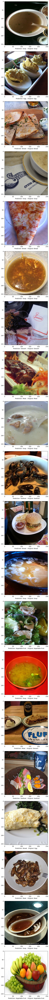

In [ ]:
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20,1,i+1)
    plt.xlabel("Predicción -" + prediction[j] +"   Original -" + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

#### **Reporte de Métricas de Evaluación**
Se presenta las métricas de evaluación para cada clase.

In [ ]:
print(classification_report(np.asarray(prediction), np.asarray(original)))

                 precision    recall  f1-score   support

          Bread       0.83      0.80      0.82       382
  Dairy product       0.70      0.79      0.74       130
        Dessert       0.72      0.88      0.79       410
            Egg       0.84      0.69      0.75       410
     Fried food       0.76      0.91      0.83       240
           Meat       0.91      0.84      0.87       467
  Noodles-Pasta       0.99      0.97      0.98       149
           Rice       0.96      0.94      0.95        98
        Seafood       0.90      0.88      0.89       311
           Soup       0.97      0.95      0.96       512
Vegetable-Fruit       0.94      0.91      0.92       238

       accuracy                           0.86      3347
      macro avg       0.86      0.87      0.86      3347
   weighted avg       0.86      0.86      0.86      3347



#### **Matriz de confusión**
Se grafica la matriz de confusión para observar el comportamiento del clasificador.

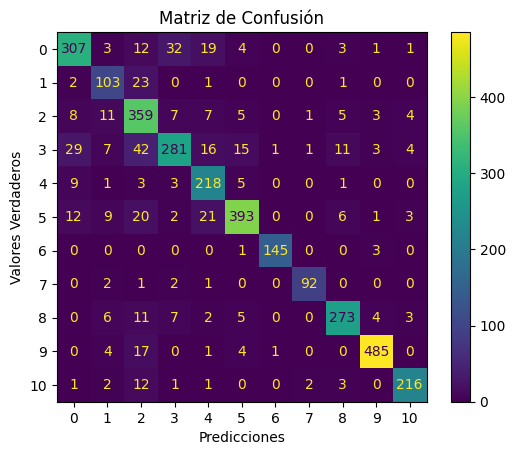

In [ ]:
cm = confusion_matrix(np.asarray(prediction), np.asarray(original))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='viridis')
# Se agregan títulos y etiquetas
plt.title('Matriz de Confusión')
plt.xlabel('Predicciones')
plt.ylabel('Valores Verdaderos')
plt.show()


### **Conclusiones | Deep Learning**


Basado en los resultados obtenidos al utilizar el modelo de Transfer Learning con InceptionResNetV2 y un Head personalizado, entrenado mediante Early Stopping y Model Checkpoint durante 10 épocas, se pueden realizar las siguientes conclusiones:

* **Rendimiento Sólido:** El modelo muestra un rendimiento sólido en la tarea de detección de alimentos en un dataset compuesto por 11 clases diferentes. Con una precisión global del 86%, demuestra una capacidad significativa para identificar con precisión los diferentes tipos de alimentos presentes en las imágenes.

* **Buen Balance en Métricas de Precisión y Recall:** Las métricas de precisión y recall para cada una de las clases sugieren un buen equilibrio entre la capacidad del modelo para predecir con precisión las clases y su capacidad para recuperar ejemplos positivos de manera efectiva. Esto es especialmente importante en tareas de detección de objetos, donde se busca minimizar tanto los falsos positivos como los falsos negativos.

* **Desempeño Generalizable:** La alta puntuación en las métricas macro y 'weighted average' indica que el modelo es capaz de generalizar bien a través de todas las clases del dataset. Esto sugiere que el modelo ha aprendido características relevantes de los alimentos que son aplicables a una variedad de clases, lo que es un resultado deseado en aplicaciones del mundo real.

**Conclusión general:** El modelo de Transfer Learning basado en InceptionResNetV2 ha demostrado un rendimiento sólido en la detección de alimentos en un dataset de 11 clases. Sin embargo, existen desafíos debido a la complejidad de las múltiples clases y la posibilidad de confusión entre clases similares. Además, la cantidad limitada de imágenes en algunas clases, como Daily product, Noodles-Pasta y Rice, puede afectar la capacidad de generalización y conducir a problemas de sobreajuste. La variabilidad en el tamaño, forma y orientación de las imágenes también es un desafío, aunque se espera mitigar esto con un sólido preprocesamiento de datos. Además, la presencia de fondos no estandarizados y la variabilidad en la iluminación pueden influir en la capacidad del modelo para extraer características de manera efectiva. A pesar de estas limitaciones, el modelo presenta un alto potencial para aplicaciones prácticas de clasificación y detección de alimentos.